In [1]:
%cd /content/drive/MyDrive/dog-vision

/content/drive/MyDrive/dog-vision


##GETTING OUR WORK SPACE READY

In [2]:
import pandas as pd
import numpy as np

#Now, Importing TensorFlow and TensorFlow Hub

In [4]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF Version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

TF Version: 2.18.0
TF Hub Version: 0.16.1


##GETTING OUR DATA READY
Our Image has to be turned in numerical format..turning images into tensors which is a numerical representation

In [5]:
##Checking the labels of our data
labels_csv = pd.read_csv("labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

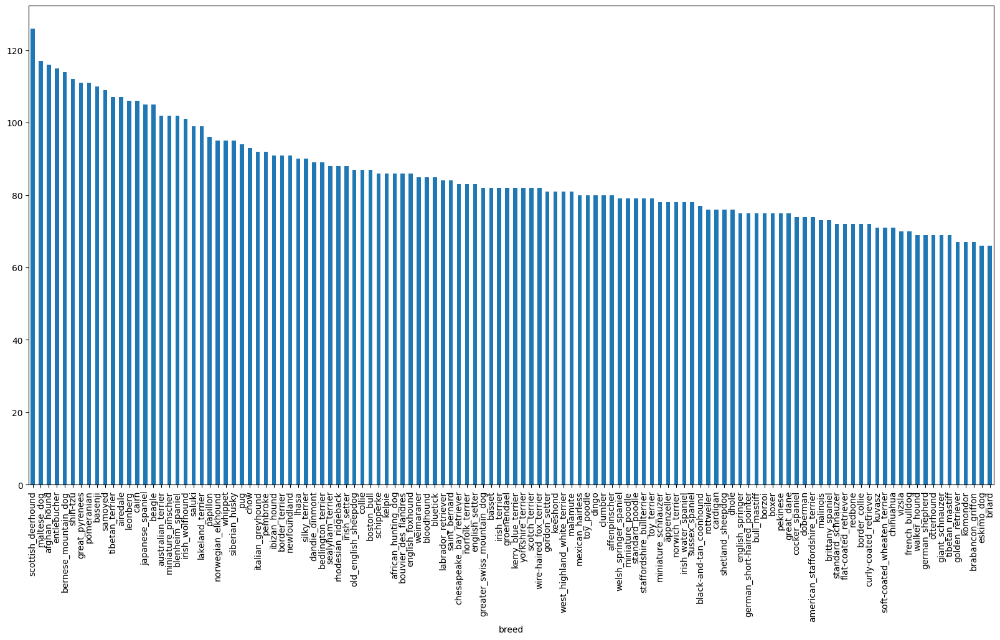

In [8]:
#Checking the value counts for category breed:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [11]:
labels_csv["breed"].value_counts().median()

82.0

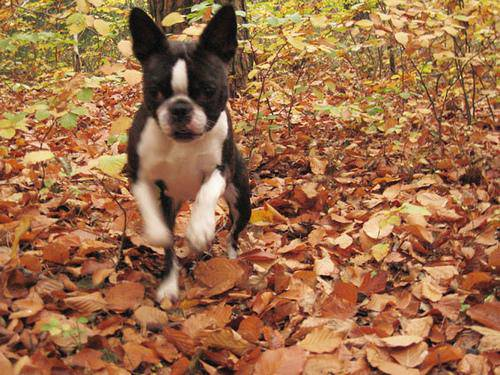

In [13]:
##Let's view an image to see what it looks like
from IPython.display import Image

Image("train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [18]:
#Now we will create pathnames from the image IDs
filenames = ["train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [19]:
##Checking whether the number of filenames is equal to the number of image files
import os

if len(os.listdir("train")) == len(filenames):
  print("Filenames match, you can proceed!")
else:
  print("They do not match.Error occured somewhere.")

Filenames match, you can proceed!


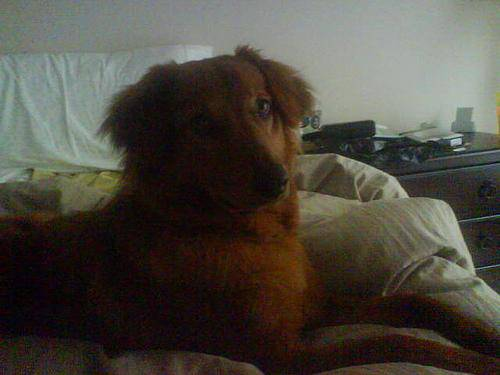

In [20]:
##Just testing
Image(filenames[1000])

In [22]:
#Preparing our data labels
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [23]:
len(labels)

10222

In [24]:
##Seeing if the number of labels match with the filenames
if len(labels) == len(filenames):
  print("Number of labels match the number of filenames")
else:
  print("Error")

Number of labels match the number of filenames


In [29]:
#Now we have to find the unique value
unique_breeds = np.unique(labels)
unique_breeds
len(unique_breeds)

120

In [30]:
#Now we will turn a single label into an array of booleans
print(labels[0])

labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [32]:
#Now we will turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [33]:
#Now we will turn the boolean array into integers
print(boolean_labels[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [34]:
##We are now going to make train and valisation sets
#Set up X and y variables
X = filenames
y = boolean_labels

#We will first start experimenting with 1000 images and then we will work our way up

In [35]:
#Set number of images
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [36]:
#let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2)

In [37]:
len(X_train), len(X_val),len(y_train), len(y_val)

(800, 200, 800, 200)

In [38]:
#PREPROCESSING IMAGES TURNING THE IMAGES INTO TENSORS

#Convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
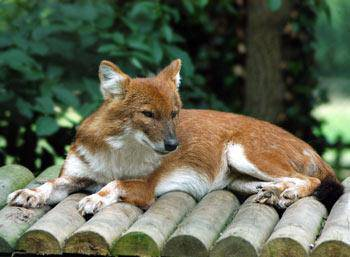

In [39]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
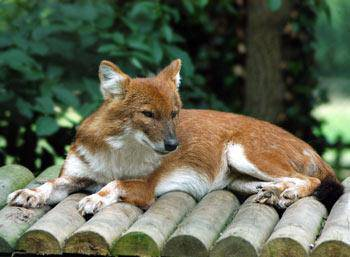

In [40]:
image

In [41]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [43]:
#Making an image to preprocess the tensor data image
IMG_SIZE = 224

#Create a function for preprocessing images (THIS IS HOW IT IS DONE!)
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes the image filepath and turns the image into a tensor
  """

  #Read the file:
  image = tf.io.read_file(image_path)

  #Turn the image into a numerical tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the color channel value from 0-225 to 0-1 value (Normalization)
  image  = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [img_size, img_size])

  return image

In [44]:
#Turning the DATA into batches
def get_image_label(image_path, label):
  image = process_image(image_path)
  label = tf.cast(label, tf.float32) #Convert from boolean to float32
  return image, label

In [45]:
#DEMO OF ABOVE FUNCTION
get_image_label(X[42], y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now let's make a function to make all of our data X and y into batches

In [57]:
#DEFINE THE BATCH SIZE
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of X and y data pairs
  Shuffles the data if it is training data but doesn't shuffle if it is validation data
  Also accepts test_data as input (no label)
  """

  #If the data is test data we don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) #filepaths and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
     print("Creating training data batches...")
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) #File paths and labels
     data = data.shuffle(buffer_size=len(X))
     data = data.map(get_image_label)
     data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [58]:
#Creating training and validation data batches
train_data =create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [59]:
##Checking out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.float32, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.float32, name=None)))

In [60]:
#Visualizing data batches
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  """
  Displays a plot of images and their labels from a data batch
  """
  ##Set up the figure
  plt.figure(figsize=(10, 10))

  for i in range(25):
    #Create a subplot
    ax = plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the images label
    plt.title(unique_breeds[labels[i].argmax()])

  plt.show()

In [61]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

In [62]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [63]:
train_images, train_labels
train_images.dtype

dtype('float32')

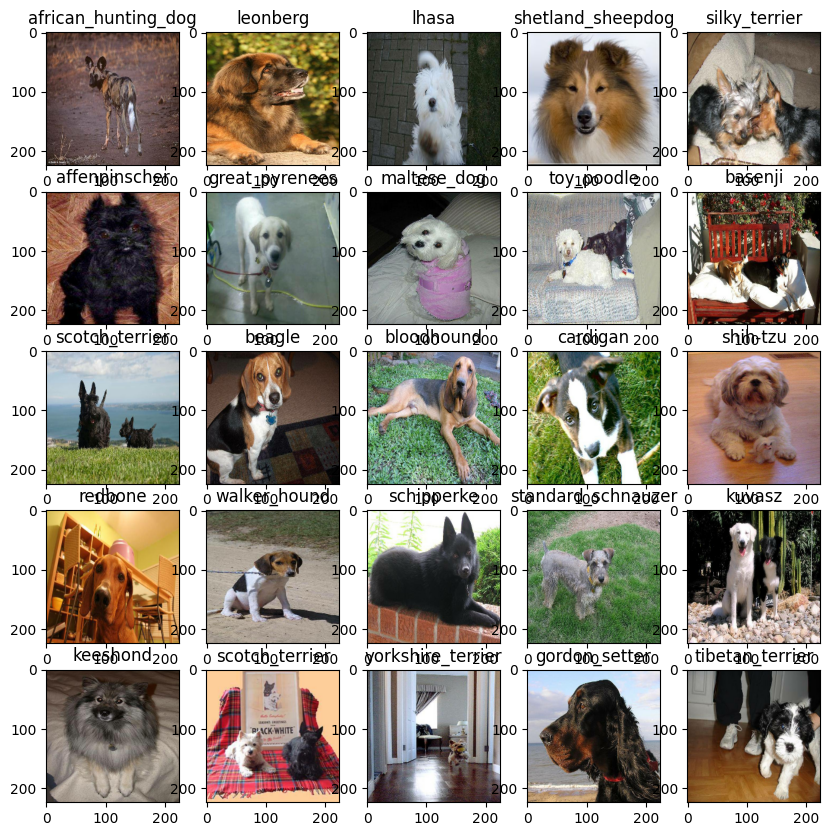

In [64]:
#Now let's visualize the image/data in a training batch
show_25_images(train_images, train_labels)

##BUILDING AND TRAINING THE MODEL

Before we train our model there are some things that we must define
The input shape, output shape, and the URL of the model we want to use

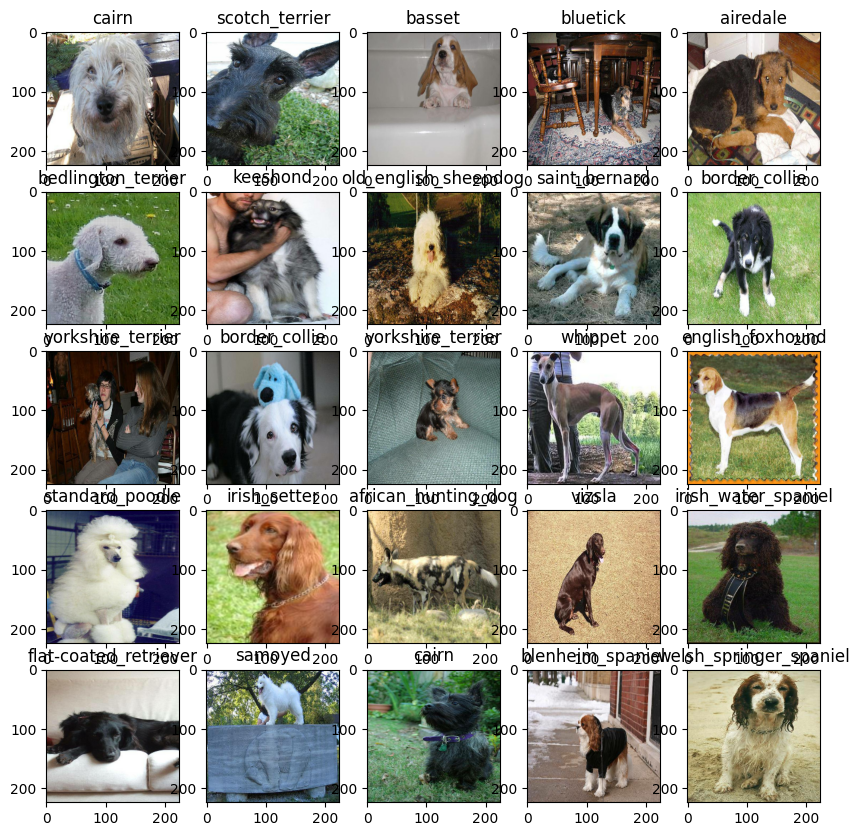

In [65]:
#Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [67]:
##SETTING UP OUR MODEL
import numpy as np
import tensorflow_hub as hub

##Taken from TensorFlow Website Model Links for classification
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"
IMG_SIZE = 224

#Load TF HUB Layer (feature extractor)
feature_extractor = hub.KerasLayer(MODEL_URL, trainable=False)

#Create dummy input (batch of 1 image, normalized float32)
dummy_input = np.random.rand(1, IMG_SIZE, IMG_SIZE, 3).astype(np.float32)

#Pass dummy input through feature extractor
output = feature_extractor(dummy_input)

print("Output shape from feature extractor: ", output.shape)

Output shape from feature extractor:  (1, 1664)


In [75]:
##STACKING A CLASSIFICATION LAYER ON TOP OF THE MODEL
import tensorflow as tf
import tensorflow_hub as hub

IMG_SIZE = 224
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"

def create_model():
  print("Building a model with: ", MODEL_URL)
  inputs = tf.keras.Input(shape=INPUT_SHAPE)

  #Use a lambda wrapper to avoid symbolic-to-numpy error
  def hub_layer(x):
    feature_extractor = hub.KerasLayer(MODEL_URL, trainable=False)
    return feature_extractor(x)

  features = tf.keras.layers.Lambda(hub_layer)(inputs)
  outputs = tf.keras.layers.Dense(OUTPUT_SHAPE, activation='softmax')(features)

  model = tf.keras.Model(inputs=inputs, outputs=outputs)
  model.compile(optimizer="adam", loss = "categorical_crossentropy", metrics=['accuracy'])
  return model

In [76]:
model = create_model()
model.summary()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_3 (Lambda)               │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 120)            │       199,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 199,800 (780.47 KB)

 Trainable params: 199,800 (780.47 KB)

 Non-trainable params: 0 (0.00 B)

Now that we have successfully created the model, we will now evaluate the model

In [77]:
##CREATING CALLBACKS

#Tensorboard Callback
%load_ext tensorboard

In [79]:
import os
import datetime
import tensorflow as tf

# Tensorboard callback
def create_tensorboard_callback():
  logdir = os.path.join("/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [80]:
# Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor = "val_accuracy", #You can also try "val_loss"
    patience = 3,
    restore_best_weights= True
)

In [81]:
##TRAINING THE DEEP NEURAL NETWORK
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [82]:
def train_model():
  #Create the model
  model = create_model()

  #Create the Tensor Callback
  tensorboard_cb = create_tensorboard_callback()

  #Train the model
  model.fit(
      x=train_data,
      epochs=NUM_EPOCHS,
      validation_data=val_data,
      callbacks=[tensorboard_cb, early_stopping]
  )

  return model

In [83]:
model = train_model()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 182s 7s/step - accuracy: 0.0659 - loss: 4.8140 - val_accuracy: 0.3850 - val_loss: 3.2262
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - accuracy: 0.7333 - loss: 1.7361 - val_accuracy: 0.5550 - val_loss: 1.9502
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - accuracy: 0.9414 - loss: 0.6314 - val_accuracy: 0.6150 - val_loss: 1.5447
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.9838 - loss: 0.2892 - val_accuracy: 0.6300 - val_loss: 1.3782
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 170ms/step - accuracy: 0.9988 - loss: 0.1795 - val_accuracy: 0.6600 - val_loss: 1.3075
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - accuracy: 1.0000 - loss: 0.1184 - val_accuracy: 0.6650 - val_loss: 1.2684
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 1.0000 - loss: 0.0932 - val_accuracy: 0.6700 - val_loss: 1.2366
E

In [84]:
##Checking the tensorboard logs
%tensorboard --logdir /logs

Output hidden; open in https://colab.research.google.com to view.

In [85]:
#MAKING AN EVALUATING PREDICTIONS USING A TRAINED MODEL
#Make predictions on the valid data

val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

In [86]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 622ms/step


array([[1.9720130e-04, 1.2451678e-04, 1.6872781e-04, ..., 1.5690524e-05,
        9.1315314e-06, 8.2758013e-03],
       [2.1793492e-02, 5.2317296e-04, 2.1151239e-02, ..., 3.6974138e-04,
        2.3682965e-03, 4.9428857e-04],
       [1.2357310e-05, 1.0508262e-04, 7.7583914e-05, ..., 4.0101557e-04,
        3.2059761e-05, 1.3806095e-03],
       ...,
       [2.7893461e-06, 7.7960103e-05, 1.2361017e-04, ..., 1.2788103e-05,
        4.4058092e-05, 2.4043056e-04],
       [3.6663220e-03, 1.2406295e-04, 2.1235411e-04, ..., 4.2950884e-05,
        9.8746015e-05, 2.7954844e-03],
       [3.0458378e-04, 2.8556282e-05, 4.7989283e-03, ..., 3.2452007e-03,
        2.8330000e-04, 6.1835468e-05]], dtype=float32)

In [87]:
predictions.shape

(200, 120)

In [88]:
#First prediction
print(predictions[0])

[1.97201298e-04 1.24516780e-04 1.68727813e-04 6.91987516e-05
 1.13329508e-04 4.31358757e-07 1.46980975e-02 6.65829648e-05
 3.94234317e-04 2.59909921e-05 4.94676606e-05 2.49255481e-05
 7.60714611e-05 1.64890389e-05 2.35843327e-04 1.14157310e-05
 1.07063579e-05 2.45694369e-01 9.42692793e-07 8.40662688e-06
 3.00970947e-04 1.85058798e-05 2.78765947e-06 1.82333562e-04
 1.42095666e-06 1.19425868e-05 3.89014095e-01 1.48269555e-05
 1.09076202e-04 2.20524118e-04 8.38949127e-05 1.03586074e-03
 6.59222569e-05 4.35692491e-05 1.07505839e-04 1.31441653e-02
 1.92872376e-05 1.12621638e-04 2.78972857e-06 1.18038897e-05
 8.45852555e-05 8.82210443e-05 1.66204391e-05 1.73786214e-06
 2.19092490e-05 2.24607684e-05 9.36522065e-06 6.00197491e-05
 3.81849095e-05 2.41235120e-05 1.84123405e-06 1.30507087e-05
 3.11712181e-04 5.67234656e-06 1.35218988e-05 8.49276876e-06
 3.98266411e-06 7.22752244e-04 1.20275090e-05 1.16031177e-01
 2.80534532e-05 2.20055404e-06 2.10446451e-04 4.49371983e-05
 6.07789261e-05 3.419212

In [89]:
index = 0

print(predictions[index])
print('Max value (Probabaility of Prediction): ', np.max(predictions[index]))
print("Sum: ", np.sum(predictions[index]))
print("Max Index: ", np.argmax(predictions[index]))
print("Predicted_Label: ", unique_breeds[np.argmax(predictions[index])])

[1.97201298e-04 1.24516780e-04 1.68727813e-04 6.91987516e-05
 1.13329508e-04 4.31358757e-07 1.46980975e-02 6.65829648e-05
 3.94234317e-04 2.59909921e-05 4.94676606e-05 2.49255481e-05
 7.60714611e-05 1.64890389e-05 2.35843327e-04 1.14157310e-05
 1.07063579e-05 2.45694369e-01 9.42692793e-07 8.40662688e-06
 3.00970947e-04 1.85058798e-05 2.78765947e-06 1.82333562e-04
 1.42095666e-06 1.19425868e-05 3.89014095e-01 1.48269555e-05
 1.09076202e-04 2.20524118e-04 8.38949127e-05 1.03586074e-03
 6.59222569e-05 4.35692491e-05 1.07505839e-04 1.31441653e-02
 1.92872376e-05 1.12621638e-04 2.78972857e-06 1.18038897e-05
 8.45852555e-05 8.82210443e-05 1.66204391e-05 1.73786214e-06
 2.19092490e-05 2.24607684e-05 9.36522065e-06 6.00197491e-05
 3.81849095e-05 2.41235120e-05 1.84123405e-06 1.30507087e-05
 3.11712181e-04 5.67234656e-06 1.35218988e-05 8.49276876e-06
 3.98266411e-06 7.22752244e-04 1.20275090e-05 1.16031177e-01
 2.80534532e-05 2.20055404e-06 2.10446451e-04 4.49371983e-05
 6.07789261e-05 3.419212

In [90]:
##MAKING AND EVALUATING PREDICTIONS ON VALIDATION DATA USING OUR MODEL TO TEXT
#Turn our probabilities into label

def get_prd_labels(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """

  return unique_breeds[np.argmax(prediction_probabilities)]


In [91]:
pred_label = get_prd_labels(predictions[67])
pred_label

'affenpinscher'

In [92]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

In [94]:
##Create a function to unbatch a valid dataset
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [95]:
get_prd_labels(labels_[0])

'cairn'

In [96]:
get_prd_labels(predictions[0])

'cairn'

In [100]:
def unbatchify(data):
  """
  Takes a batch dataset of image label tensors and returns separate arrays of image and labels
  """

  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [101]:
#VISUALIZING MODEL PREDICTIONS
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  ##Get the pred label
  pred_label = get_prd_labels(pred_prob)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  ##Change the color
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color=color)



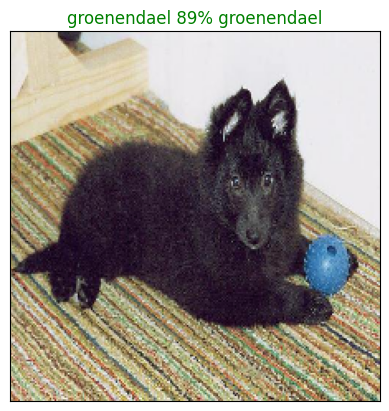

In [102]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

In [103]:
##VISULAIING AND PREDICTING IMAGES 2

import matplotlib.pyplot as plt
import numpy as np

def plot_pred_conf(prediction_probabilities, labels, n=1):
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Make sure true_label is a breed name string
    if not isinstance(true_label, str):
        true_label = unique_breeds[np.argmax(true_label)]
    true_label = str(true_label)  # Ensure it's a pure Python string

    pred_label = get_prd_labels(pred_prob)

    # Get top 10 predictions
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    top_10_pred_labels = [str(breed) for breed in unique_breeds[top_10_pred_indexes]]  # Convert to str

    # Plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="gray")
    plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")
    plt.ylabel("Prediction Probability")
    plt.title(f"True: {true_label} | Predicted: {pred_label}")
    plt.tight_layout()

    # Color the true label bar green if it's in top 10
    if true_label in top_10_pred_labels:
        green_index = top_10_pred_labels.index(true_label)
        top_plot[green_index].set_color("green")

    plt.show()


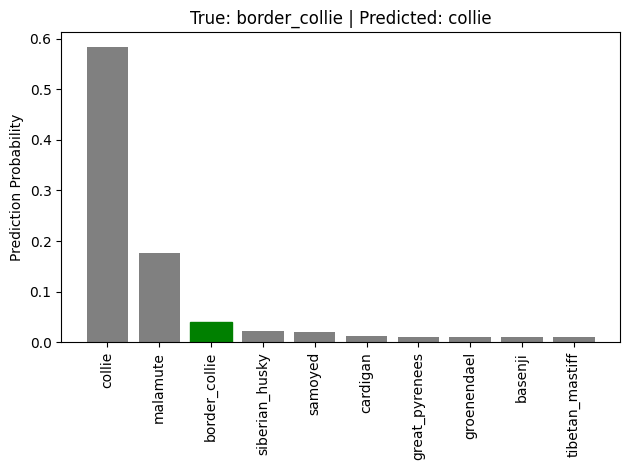

In [104]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

In [105]:
##VISUALIZING AND PREDCITING 3
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

# Each sample needs 2 plots (image + bar chart)
total_subplots = num_images * 2

fig, axs = plt.subplots(num_rows, num_cols * 2, figsize=(num_cols * 10, num_rows * 5))

# Flatten the axes array for easy linear indexing
axs = axs.flatten()

for i in range(num_images):
    idx = i + i_multiplier
    img_ax = axs[i * 2]        # Left plot: image
    bar_ax = axs[i * 2 + 1]    # Right plot: prediction bar

    # Plot image
    plt.sca(img_ax)
    plot_pred(
        prediction_probabilities=predictions,
        labels=val_labels,
        images=val_images,
        n=idx
    )

    # Plot confidence bar chart
    plt.sca(bar_ax)
    plot_pred_conf(
        prediction_probabilities=predictions,
        labels=val_labels,
        n=idx
    )

plt.tight_layout()
plt.show()



Output hidden; open in https://colab.research.google.com to view.

In [106]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """

  ##Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/dog-vision/models",
                          datetime.datetime.now().strftime("%Y5m$d-%H%M%s"))

  model_path = modeldir + "-" + suffix + ".keras" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [107]:
predictions

array([[1.9720130e-04, 1.2451678e-04, 1.6872781e-04, ..., 1.5690524e-05,
        9.1315314e-06, 8.2758013e-03],
       [2.1793492e-02, 5.2317296e-04, 2.1151239e-02, ..., 3.6974138e-04,
        2.3682965e-03, 4.9428857e-04],
       [1.2357310e-05, 1.0508262e-04, 7.7583914e-05, ..., 4.0101557e-04,
        3.2059761e-05, 1.3806095e-03],
       ...,
       [2.7893461e-06, 7.7960103e-05, 1.2361017e-04, ..., 1.2788103e-05,
        4.4058092e-05, 2.4043056e-04],
       [3.6663220e-03, 1.2406295e-04, 2.1235411e-04, ..., 4.2950884e-05,
        9.8746015e-05, 2.7954844e-03],
       [3.0458378e-04, 2.8556282e-05, 4.7989283e-03, ..., 3.2452007e-03,
        2.8330000e-04, 6.1835468e-05]], dtype=float32)

##NOW FINALLY WE WILL TEST THE TRAINING MODEL ON THE FULL DATASET

In [108]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [111]:
full_model = create_model()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4


In [112]:
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [113]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1617s 5s/step - accuracy: 0.5164 - loss: 2.2130
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 72s 110ms/step - accuracy: 0.9012 - loss: 0.3782
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - accuracy: 0.9546 - loss: 0.2072
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 109ms/step - accuracy: 0.9718 - loss: 0.1428
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step - accuracy: 0.9863 - loss: 0.0953
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - accuracy: 0.9927 - loss: 0.0695
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - accuracy: 0.9976 - loss: 0.0470
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - accuracy: 0.9981 - loss: 0.0368
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step - accuracy: 0.9994 - loss: 0.0300
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - accuracy: 0.9987 - loss: 0.0263
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - accuracy: 0.9990 - loss: 0.0205
Epoch 12/

In [114]:
full_model

<Functional name=functional_3, built=True>

In [124]:
#Now making predictions on test data:
test_path = "test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['test/e0f2620cb1ebf648b986c8a09dbd3664.jpg',
 'test/e57fded38af2f081403feefb324ed3a9.jpg',
 'test/e35b90290702042d17ceee2aaf2d1475.jpg',
 'test/e5ad4cc7818e4eed04d209da177afa6f.jpg',
 'test/df4b040b13c5f514d215ba7c0813eaf8.jpg',
 'test/e141811c20cade75f5cb3b7da86320a8.jpg',
 'test/e000b7b3b37659a771d0151dc453bc0a.jpg',
 'test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'test/de93f567cf5830e982182435db086b93.jpg',
 'test/e60df508ef9f70f9c556003827827234.jpg']

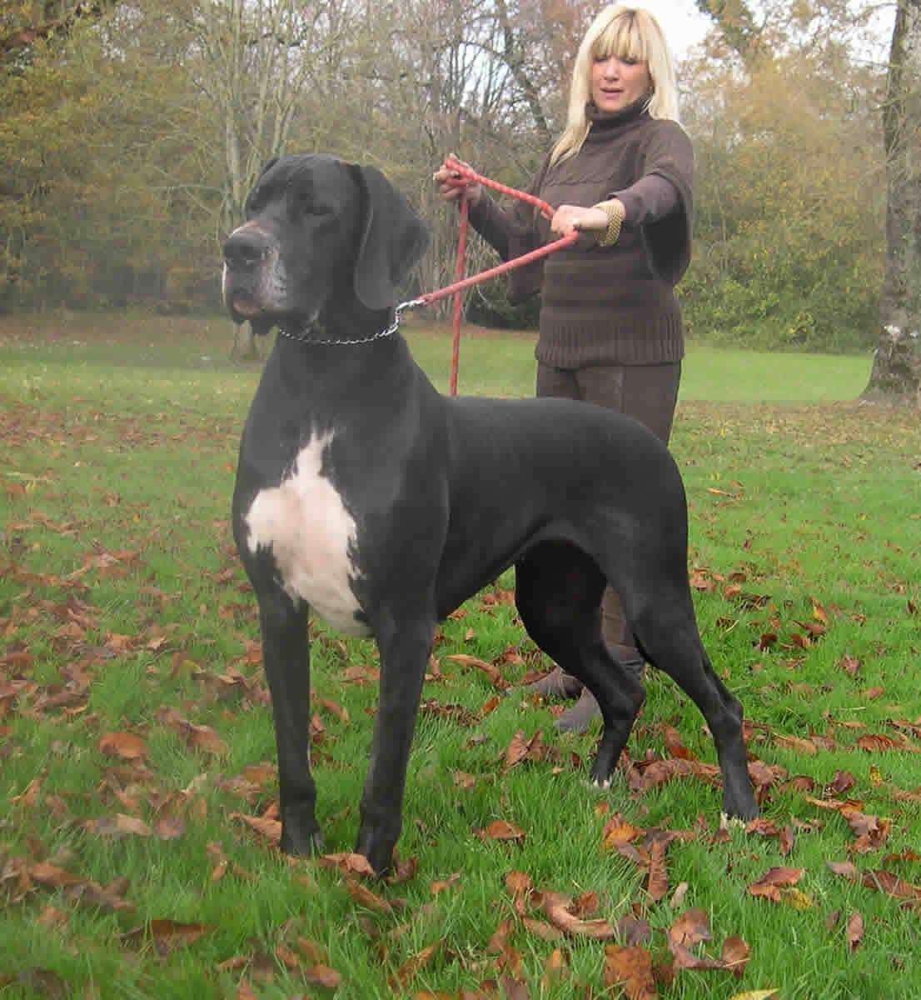

In [125]:
##Let's view an image to see what it looks like
from IPython.display import Image

Image(test_filenames[0])

In [126]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [127]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [128]:
#Finally, make predictions using test data on full model.
test_predictions = full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 1928s 6s/step


In [129]:
test_predictions.shape

(10357, 120)

In [139]:
val_loss, val_accuracy = full_model.evaluate(val_data)
print(f"Validation Accuracy: {val_accuracy:.4f}")


7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 565ms/step - accuracy: 1.0000 - loss: 0.0111
Validation Accuracy: 1.0000


In [140]:
import numpy as np

confidences = np.max(test_predictions, axis=1)  # max probability for each prediction
print(f"Average confidence: {np.mean(confidences):.4f}")
print(f"Number of predictions with >90% confidence: {(confidences > 0.9).sum()}")


Average confidence: 0.8944
Number of predictions with >90% confidence: 7335


In [141]:
import matplotlib.pyplot as plt

def plot_prediction(image_path, prediction):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img)
    plt.imshow(img)
    plt.axis('off')

    pred_index = np.argmax(prediction)
    pred_label = unique_breeds[pred_index]
    confidence = np.max(prediction)

    plt.title(f"Predicted: {pred_label} ({confidence:.2f})")
    plt.show()

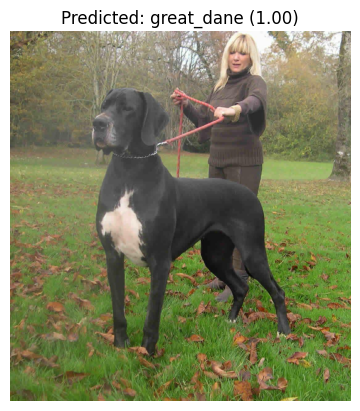

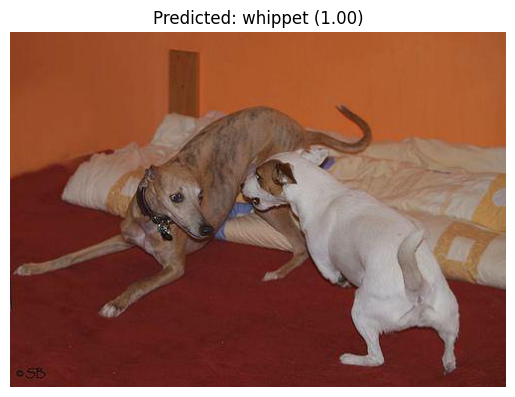

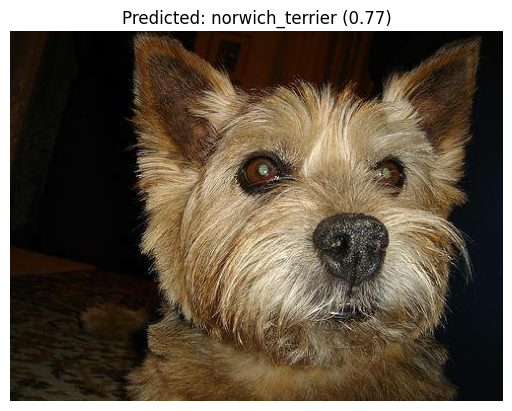

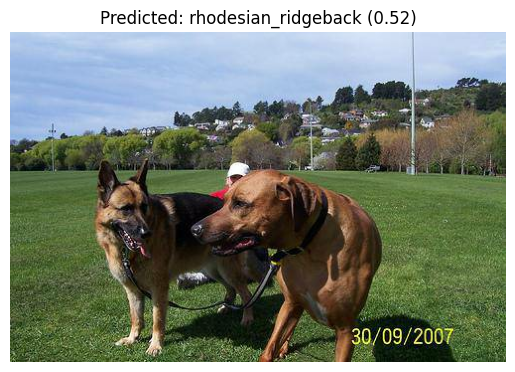

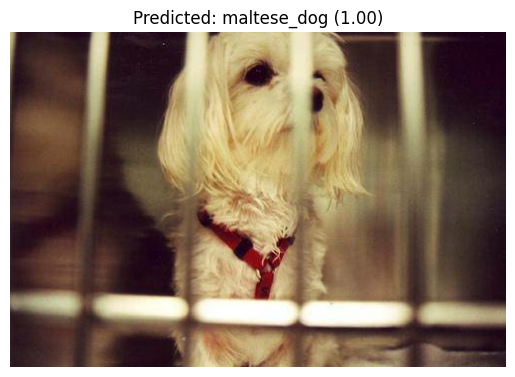

In [142]:
for i in range(5):
    plot_prediction(test_filenames[i], test_predictions[i])

In [143]:
import pandas as pd

predicted_indices = np.argmax(test_predictions, axis=1)
predicted_labels = unique_breeds[predicted_indices]

submission_df = pd.DataFrame({
    "id": [f.split("/")[-1].split(".")[0] for f in test_filenames],
    "breed": predicted_labels
})

submission_df.to_csv("submission.csv", index=False)

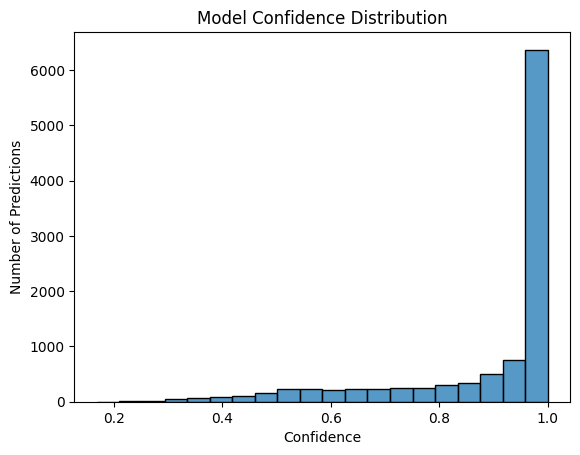

In [144]:
import seaborn as sns

confidences = np.max(test_predictions, axis=1)
sns.histplot(confidences, bins=20)
plt.title("Model Confidence Distribution")
plt.xlabel("Confidence")
plt.ylabel("Number of Predictions")
plt.show()

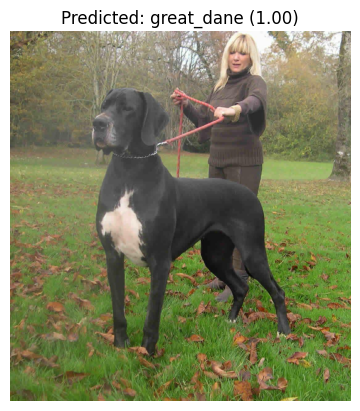

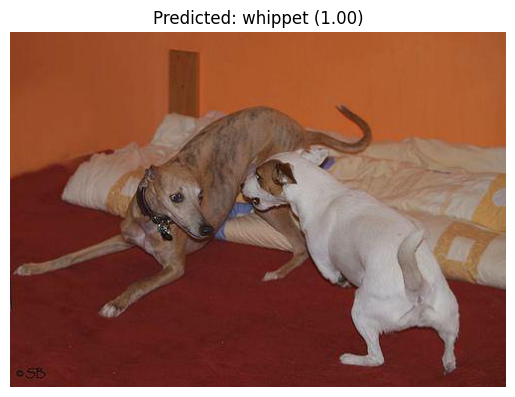

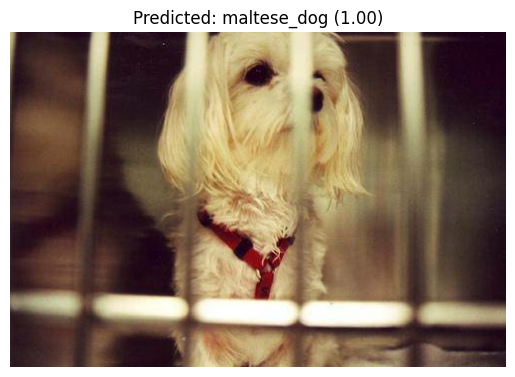

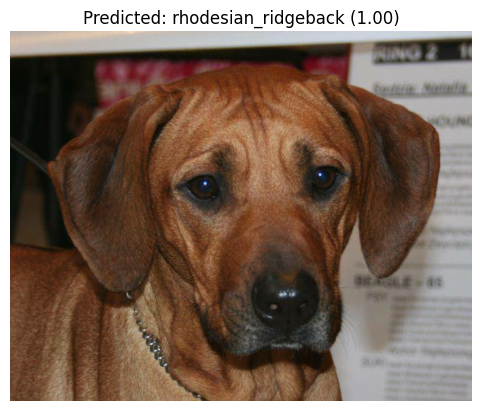

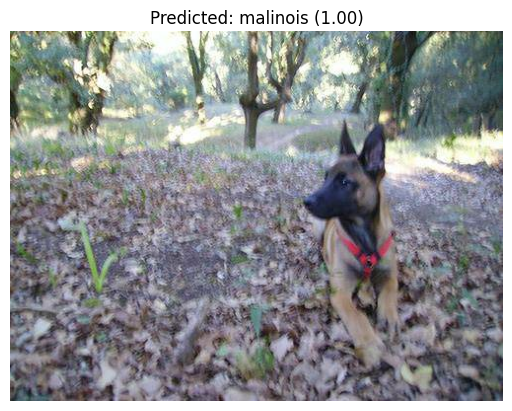

In [145]:
confidences = np.max(test_predictions, axis=1)
high_conf_indices = np.where(confidences > 0.99)[0]

# Plot a few
for i in high_conf_indices[:5]:
    plot_prediction(test_filenames[i], test_predictions[i])
